## Load in Packages

In [1]:
suppressPackageStartupMessages({ 
    library(data.table) 
    library(dplyr) 
    library(ggplot2) 
    library(SingleCellExperiment)
    library(dplyr)
    library(celldex)
    library(SingleR)
    library(RColorBrewer)
    library(scater) 
    library(StabMap) 
    library(scran) 
    library(harmony) 
    library(patchwork)
    library(Seurat)
    library(plotly)
    library(pheatmap)
    library(batchelor)
    library(ggpubr)
    library(cowplot)
    library(viridis)
    library(ggplot2)
    library(cowplot)
    library(grid)
    library(ragg) # For rasterized output
    library(ggplot2)
    library(Seurat)
    library(patchwork)
    library(cowplot)
    library(ragg)
    library(gridExtra)
    library(ggplot2)
    library(patchwork)
    library(Cairo)
    library(grid)
    library(png)
})

## Load in R Scripts that Contain Cell Type Colours Etc.

In [2]:
script_files <- list.files("projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/R_scripts", 
                           pattern = "\\.[rR]$", full.names = TRUE)

invisible(lapply(script_files, source))

## Data Locations

In [3]:
##### Load in Seurat Objects for post QC analyses #####

io = list()
io$main = "/rds/project/rds-SDzz0CATGms/users/ltgh2" # this is the main directory

# Set the working directory
setwd(io$main)

io$atlas = file.path(io$main, "projects/03_seqFISH_FINAL/code/extended_atlas_integration/processed_downsampled/downsample_10K_within_timpoint_all_stages.Rds")
io$seqFISH = file.path(io$main, "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_and_across_dataset_integration_without_neighbour_features_E6_7_8.Rds") 

##### Load in StabMAP_Outputs #####
io$StabMAP_reweighted_MNNcorrected_original_counts_without_neigh = file.path(io$main, "projects/03_seqFISH_FINAL/code/stab_map_all_together_post_QC/output/StabMAP_allstages_postQC_reweighted_MNNcorrected_original_counts_without_neigh.Rds")
io$StabMAP_reweighted_MNNcorrected_integrated_counts_without_neigh = file.path(io$main, "projects/03_seqFISH_FINAL/code/stab_map_all_together_post_QC/output/StabMAP_allstages_postQC_reweighted_MNNcorrected_integrated_counts_without_neigh.Rds")

## Load in the seqFISH CellType Labels
io$seqFISH_labels = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_label_transfer/output/StabMAP_all_stages_post_QC_reweighted_MNNcorrected_original_counts_without_neigh_LABELS.Rds")

## Load in the seqFISH Imputed Gene Expression
io$seqFISH_imputed_logcounts_e6 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e6_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e7 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e7_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_1 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo1_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_2 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo2_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_3 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo3_postQC_imputed_RNA.Rds")

## Load in the seqFISH UMAP coordinates
io$UMAP_coordinates = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/stab_map_umap_generation/processed/StabMAP_allstage_postQC_MNNoriginal_UMAP.rds")

In [4]:
io$seqFISH_preQC = file.path(io$main, "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_within_and_across_dataset_integration_without_neighbour_features_E6_7_8.Rds") 

In [5]:
##### Load in within timepoint integrated Seurat Objects for pre and post QC analyses #####
io$timepoint_pre_QC = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_within_dataset_integration_without_neighbour_features_E6_7_8.Rds")

io$timepoint_post_QC = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_dataset_integration_without_neighbour_features_E6_7_8.Rds")

In [6]:
##### Load in within timepoint integrated Seurat Objects for pre and post QC analyses #####
io$post_QC_early_embryos_ONLY = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_and_across_dataset_integration_without_neighbour_features_E6_7_ONLY.Rds")

In [7]:
##### Load in the refined annotations and final metadata #####
io$FINAL_REFINED_ANNOTATIONS = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/1B_FINAL_REFINED_ANNOTATIONS_REVISIONS_POST_REVISION.Rds")

## Load in Seurat Objects and to the Seurat Object add the StabMAP UMAP, Transferred Cell Type Labels and Imputed Gene Expression Matrix

In [8]:
# Load in the seqFISH object_postQC
seqFISH = readRDS(io$seqFISH)

# Load in celltype, stage and anatomy labels
seqFISH_labels = readRDS(io$seqFISH_labels)

# Update the colnames in the seqFISH meta.data
seqFISH_labels_updated <- seqFISH_labels
colnames(seqFISH_labels_updated) <- c("nearest_cell_label_transfer", "celltype_extended_atlas", "stage", "anatomy", "somite_count")


seqFISH <- AddMetaData(seqFISH, metadata = seqFISH_labels_updated)

# Load in the imputed gene expression 
seqFISH_imputed_logcounts_e6 = readRDS(io$seqFISH_imputed_logcounts_e6)
seqFISH_imputed_logcounts_e7 = readRDS(io$seqFISH_imputed_logcounts_e7)
seqFISH_imputed_logcounts_e8_1 = readRDS(io$seqFISH_imputed_logcounts_e8_1)
seqFISH_imputed_logcounts_e8_2 = readRDS(io$seqFISH_imputed_logcounts_e8_2)
seqFISH_imputed_logcounts_e8_3 = readRDS(io$seqFISH_imputed_logcounts_e8_3)

# Create a combined matrix of gene expression across all time points
imputed_expression <- cbind(seqFISH_imputed_logcounts_e6$scRNA.RNA, 
                           seqFISH_imputed_logcounts_e7$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_1$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_2$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_3$scRNA.RNA)

# Creat a new assay object to store imputed data
imp <- CreateAssayObject(data = imputed_expression)

# add this assay to the previously created Seurat object
seqFISH[["imputed"]] <- imp

seqFISH_postQC <- seqFISH

seqFISH_postQC

An object of class Seurat 
28723 features across 63188 samples within 4 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 3 other assays present: originalexp, within_timepoint_integration, imputed
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

In [9]:
post_QC_early_embryos_ONLY <- readRDS(io$post_QC_early_embryos_ONLY)

In [10]:
# Load in the seqFISH object_postQC
atlas = readRDS(io$atlas)

In [11]:
seqFISH_preQC = readRDS(io$seqFISH_preQC)

In [12]:
seqFISH_preQC

An object of class Seurat 
1053 features across 73470 samples within 3 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 2 other assays present: originalexp, within_timepoint_integration
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

In [13]:
# Load in the UMAP coordinates
UMAP_coordinates = readRDS(io$UMAP_coordinates)

# Load in the StabMAP coordinates
StabMAP_reweighted_MNNcorrected_original_counts_without_neigh = readRDS(io$StabMAP_reweighted_MNNcorrected_original_counts_without_neigh)

##Create dimension reduced objects to insert into the seuart object
StabMAP_original <- CreateDimReducObject(embeddings = StabMAP_reweighted_MNNcorrected_original_counts_without_neigh, 
                                         key = "StabMap.original",
                                         assay = "originalexp")

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from StabMap.original to StabMaporiginal_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to StabMaporiginal_”


In [14]:
# load in the final refined_annotations
FINAL_REFINED_ANNOTATIONS_UPDATED = readRDS(io$FINAL_REFINED_ANNOTATIONS)

In [15]:
FINAL_REFINED_ANNOTATIONS <- FINAL_REFINED_ANNOTATIONS_UPDATED %>% 
  select(-embryo)

In [16]:
colnames(FINAL_REFINED_ANNOTATIONS)

[1] "cell_ID"                                             
 [2] "orig.ident"                                          
 [3] "nCount_RNA"                                          
 [4] "nFeature_RNA"                                        
 [5] "seqFISH_celltype"                                    
 [6] "extended_atlas_celltype"                             
 [7] "AP"                                                  
 [8] "DV"                                                  
 [9] "dataset"                                             
[10] "cluster"                                             
[11] "subcluster"                                          
[12] "cluster_subcluster"                                  
[13] "stage"                                               
[14] "anatomy"                                             
[15] "UMAP_1"                                              
[16] "UMAP_2"                                              
[17] "celltype_PijuanSala2019"                             
[18] "majority_seqFISH_celltype"                           
[19] "majority_seqFISH_celltype_proportion"                
[20] "majority_extended_atlas_celltype"                    
[21] "majority_extended_atlas_celltype_proportion"         
[22] "majority_celltype_PijuanSala2019_celltype"           
[23] "majority_celltype_PijuanSala2019_celltype_proportion"
[24] "stage_transfer"                                      
[25] "poor_stage_alignment"                                
[26] "proportion_seqFISH_cells_per_subcluster"             
[27] "joint_clusters_pass_QC"                              
[28] "stage_alignment_pass_QC"                             
[29] "passed_QC"                                           
[30] "refined_annotation"

## Generate Individual Seurat Objects for seqFISH and scRNA

### Update the Embryo Labels in the Seurat Objects

In [17]:
update_embryo_names <- function(seurat_obj) {
    # Define the mapping for renaming embryos
    embryo_mapping <- c("embryo1" = "embryo_5",
                        "embryo2" = "embryo_6",
                        "embryo3" = "embryo_7",
                        "embryo6" = "embryo_1",
                        "embryo7" = "embryo_2",
                        "embryo4" = "embryo_3",
                        "embryo5" = "embryo_4")

    embryo_sf_mapping <- c("embryo1" = "5",
                           "embryo2" = "6",
                           "embryo3" = "7",
                           "embryo6" = "1",
                           "embryo7" = "2",
                           "embryo4" = "3",
                           "embryo5" = "4")

    # Update embryo names
    seurat_obj@meta.data$embryo_name_updated <- embryo_mapping[seurat_obj@meta.data$embryo]
    seurat_obj@meta.data$embryo_name_updated_sf <- embryo_sf_mapping[seurat_obj@meta.data$embryo]
    
    return(seurat_obj)
}

# Example usage:
seqFISH_preQC <- update_embryo_names(seqFISH_preQC)
#seurat_combined_seqFISH <- update_embryo_names(seurat_combined_seqFISH)

## Get Marker Genes List Organized

In [18]:
script_files <- list.files("projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/R_scripts", 
                           pattern = "\\.[rR]$", full.names = TRUE)

invisible(lapply(script_files, source))

In [19]:
# Flatten the list into a single character vector
all_marker_genes <- unlist(Imaz_Rosshandler_marker_genes)

# Print the result
str(all_marker_genes)

 Named chr [1:579] "Hoxa10" "Hoxa11" "Tbx2" "Tbx4" "Cdh5" "Hoxa11" "Plac1" ...
 - attr(*, "names")= chr [1:579] "Allantois1" "Allantois2" "Allantois3" "Allantois4" ...


In [20]:
# Remove the names from the vector
all_marker_genes <- unique(unname(all_marker_genes))

# Print the result
str(all_marker_genes)

 chr [1:315] "Hoxa10" "Hoxa11" "Tbx2" "Tbx4" "Cdh5" "Plac1" "Vcam1" "Aqp2" ...


## PIPELINE TO GENERATE SUPPLEMENTARY FIGURES CONNECTED TO MAIN FIGURE 2

#### getting Objects Ready

In [21]:
### LOAD IN DF_TOTAL ###
seqFISH_preQC <- AddMetaData(seqFISH_preQC, metadata = FINAL_REFINED_ANNOTATIONS)
seqFISH_preQC@meta.data$refined_annotation <- as.character(seqFISH_preQC@meta.data$refined_annotation)
seqFISH_preQC_updated <- seqFISH_preQC

# Replace NA with "failed_qc"
seqFISH_preQC_updated@meta.data$refined_annotation <- ifelse(
  is.na(seqFISH_preQC_updated@meta.data$refined_annotation),
  "failed_qc",
  seqFISH_preQC_updated@meta.data$refined_annotation
)

# add the spatial coordinates to the data.frame
spatial_coordinates <- as.data.frame(seqFISH_preQC_updated@reductions$spatial@cell.embeddings)
spatial_coordinates$cell_ID <- row.names(spatial_coordinates)

df <- seqFISH_preQC_updated@meta.data
df_total <- cbind(spatial_coordinates, df)

# Replace NA with "failed_qc"
df_total$refined_annotation <- ifelse(
  is.na(df_total$refined_annotation),
  "failed_qc",
  df_total$refined_annotation
)

In [22]:
dim(df_total)

[1] 73470    57

In [23]:
head(df)

,orig.ident,nCount_originalexp,nFeature_originalexp,dim1,dim2,dim3,sample_id,embryo,pos,fov,...,majority_extended_atlas_celltype_proportion,majority_celltype_PijuanSala2019_celltype,majority_celltype_PijuanSala2019_celltype_proportion,stage_transfer,poor_stage_alignment,proportion_seqFISH_cells_per_subcluster,joint_clusters_pass_QC,stage_alignment_pass_QC,passed_QC,refined_annotation
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<chr>,<dbl>,<chr>,<lgl>,<dbl>,<lgl>,<lgl>,<lgl>,<chr>
embryo6_Pos0_cell2,embryo6,138,93,600.3434,125.1070,2.500691,sample01,embryo6,Pos0,fov.1,...,0.9444444,Anterior Primitive Streak,0.6777778,E7.25,FALSE,0.06666667,TRUE,TRUE,TRUE,Anterior Primitive Streak
embryo6_Pos0_cell3,embryo6,50,37,429.2308,210.4952,3.504292,sample01,embryo6,Pos0,fov.1,...,0.7821429,New cells,0.7178571,E8.75,TRUE,0.34285714,TRUE,FALSE,FALSE,Migratory neural crest
embryo6_Pos0_cell4,embryo6,120,59,439.7686,221.7524,4.922626,sample01,embryo6,Pos0,fov.1,...,0.6019417,Epiblast,0.6601942,E7.25,FALSE,0.89320388,TRUE,TRUE,TRUE,Epiblast
embryo6_Pos0_cell5,NA,28,23,413.1775,197.8247,1.840986,sample01,embryo6,Pos0,fov.1,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,failed_qc
embryo6_Pos0_cell6,NA,16,10,436.8529,202.6335,5.505245,sample01,embryo6,Pos0,fov.1,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,failed_qc
embryo6_Pos0_cell7,embryo6,87,48,440.2362,164.0092,1.508630,sample01,embryo6,Pos0,fov.1,...,0.9482440,Epiblast,0.9667283,E7.25,FALSE,0.04621072,TRUE,TRUE,TRUE,Epiblast


In [24]:
head(df_total)

,dim_1,dim_2,dim_3,cell_ID,orig.ident,nCount_originalexp,nFeature_originalexp,dim1,dim2,dim3,...,majority_extended_atlas_celltype_proportion,majority_celltype_PijuanSala2019_celltype,majority_celltype_PijuanSala2019_celltype_proportion,stage_transfer,poor_stage_alignment,proportion_seqFISH_cells_per_subcluster,joint_clusters_pass_QC,stage_alignment_pass_QC,passed_QC,refined_annotation
,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,...,<dbl>,<chr>,<dbl>,<chr>,<lgl>,<dbl>,<lgl>,<lgl>,<lgl>,<chr>
embryo6_Pos0_cell2,600.3434,125.1070,2.500691,embryo6_Pos0_cell2,embryo6,138,93,600.3434,125.1070,2.500691,...,0.9444444,Anterior Primitive Streak,0.6777778,E7.25,FALSE,0.06666667,TRUE,TRUE,TRUE,Anterior Primitive Streak
embryo6_Pos0_cell3,429.2308,210.4952,3.504292,embryo6_Pos0_cell3,embryo6,50,37,429.2308,210.4952,3.504292,...,0.7821429,New cells,0.7178571,E8.75,TRUE,0.34285714,TRUE,FALSE,FALSE,Migratory neural crest
embryo6_Pos0_cell4,439.7686,221.7524,4.922626,embryo6_Pos0_cell4,embryo6,120,59,439.7686,221.7524,4.922626,...,0.6019417,Epiblast,0.6601942,E7.25,FALSE,0.89320388,TRUE,TRUE,TRUE,Epiblast
embryo6_Pos0_cell5,413.1775,197.8247,1.840986,embryo6_Pos0_cell5,NA,28,23,413.1775,197.8247,1.840986,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,failed_qc
embryo6_Pos0_cell6,436.8529,202.6335,5.505245,embryo6_Pos0_cell6,NA,16,10,436.8529,202.6335,5.505245,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,failed_qc
embryo6_Pos0_cell7,440.2362,164.0092,1.508630,embryo6_Pos0_cell7,embryo6,87,48,440.2362,164.0092,1.508630,...,0.9482440,Epiblast,0.9667283,E7.25,FALSE,0.04621072,TRUE,TRUE,TRUE,Epiblast


In [25]:
# Example usage:
df_total$embryo_name_updated <- recode(df_total$embryo,
                        "embryo1" = "embryo_5",
                        "embryo2" = "embryo_6",
                        "embryo3" = "embryo_7",
                        "embryo6" = "embryo_1",
                        "embryo7" = "embryo_2",
                        "embryo4" = "embryo_3",
                        "embryo5" = "embryo_4")

df_total$embryo_name_updated_sf <- recode(df_total$embryo,
                           "embryo1" = "5",
                           "embryo2" = "6",
                           "embryo3" = "7",
                           "embryo6" = "1",
                           "embryo7" = "2",
                           "embryo4" = "3",
                           "embryo5" = "4")

In [26]:
table(df_total$embryo_name_updated_sf, useNA = "ifany")


    1     2     3     4     5     6     7 
 3811  4355  4545  2083 19566 14941 24169 

In [27]:
FINAL_REFINED_ANNOTATIONS$dataset <- factor(FINAL_REFINED_ANNOTATIONS$dataset, levels = c("seqFISH", "scRNA"))

In [28]:
# Function to create an individual embryo plot
create_embryo_plot <- function(df_total, embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors) {
  options(repr.plot.width = 40, repr.plot.height = 10)
  embryo_plot <- subset(df_total, embryo_name_updated_sf %in% embryo_vector)
  cell_type_plot <- subset(df_total, embryo_name_updated_sf %in% embryo_vector & refined_annotation %in% celltype_vector)
  ggplot(cell_type_plot, aes(dim1, dim2, col=refined_annotation)) + 
    geom_point(data=embryo_plot, col='#E0E0E0', size = point_size_1) + 
    geom_point(size = point_size_2) +
    facet_wrap(~embryo_name_updated_sf) +
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(legend.position='none', strip.text = element_blank()) +  # Remove strip text
    coord_fixed(ratio = 1)
}

# Function to create individual embryo plots
create_individual_embryo_plots <- function(df_total, embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors) {
  plots <- list()
  for (embryo in embryo_vector) {
    current_embryo_vector <- c(embryo)
    plot <- create_embryo_plot(df_total, current_embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors)
    plots[[embryo]] <- plot
  }
  return(plots)
}

create_left_side_plot <- function(final_refined_annotations, celltype_vector, point_size_1, point_size_2, refined_annotation_colors, Estage_to_include) {
  # Subset for seqFISH dataset
  cell_type_plot_seqFISH <- subset(final_refined_annotations, 
                                   refined_annotation %in% celltype_vector & 
                                   stage %in% Estage_to_include & 
                                   dataset %in% "seqFISH")
  
  # Subset for scRNA dataset (including all stages)
  cell_type_plot_scRNA <- subset(final_refined_annotations, 
                                 refined_annotation %in% celltype_vector & 
                                 dataset %in% "scRNA")
  
  # Combine both subsets
  cell_type_plot <- rbind(cell_type_plot_seqFISH, cell_type_plot_scRNA)
  
  # Plot
  ggplot(cell_type_plot, aes(UMAP_1, UMAP_2, col=refined_annotation)) + 
    geom_point(data=final_refined_annotations, col='#E0E0E0', size = point_size_1) + 
    geom_point(size = point_size_2) +
    facet_wrap(~ dataset, ncol = 1) +  # Ensuring vertical stacking
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)
}

In [29]:
# Function to create an individual embryo plot
create_embryo_plot <- function(df_total, embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors) {
  options(repr.plot.width = 40, repr.plot.height = 10)
  embryo_plot <- subset(df_total, embryo_name_updated_sf %in% embryo_vector)
  cell_type_plot <- subset(df_total, embryo_name_updated_sf %in% embryo_vector & refined_annotation %in% celltype_vector & joint_clusters_pass_QC == TRUE)
  ggplot(cell_type_plot, aes(dim1, dim2, col=refined_annotation)) + 
    geom_point(data=embryo_plot, col='#E0E0E0', size = point_size_1) + 
    geom_point(size = point_size_2) +
    facet_wrap(~embryo_name_updated_sf) +
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(legend.position='none', strip.text = element_blank()) +  # Remove strip text
    coord_fixed(ratio = 1)
}

# Function to create individual embryo plots
create_individual_embryo_plots <- function(df_total, embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors) {
  plots <- list()
  for (embryo in embryo_vector) {
    current_embryo_vector <- c(embryo)
    plot <- create_embryo_plot(df_total, current_embryo_vector, celltype_vector, point_size_1, point_size_2, refined_annotation_colors)
    plots[[embryo]] <- plot
  }
  return(plots)
}

create_left_side_plot <- function(final_refined_annotations, celltype_vector, point_size_1, point_size_2, refined_annotation_colors, Estage_to_include) {
  # Subset for seqFISH dataset
  cell_type_plot_seqFISH <- subset(final_refined_annotations, 
                                   joint_clusters_pass_QC == TRUE &
                                   refined_annotation %in% celltype_vector & 
                                   stage %in% Estage_to_include & 
                                   dataset %in% "seqFISH")
  
  # Subset for scRNA dataset (including all stages)
  cell_type_plot_scRNA <- subset(final_refined_annotations, 
                                 joint_clusters_pass_QC == TRUE &
                                 refined_annotation %in% celltype_vector & 
                                 dataset %in% "scRNA")
  
  # Combine both subsets
  cell_type_plot <- rbind(cell_type_plot_seqFISH, cell_type_plot_scRNA)
  
  # Plot
  ggplot(cell_type_plot, aes(UMAP_1, UMAP_2, col=refined_annotation)) + 
    geom_point(data=final_refined_annotations, col='#E0E0E0', size = point_size_1) + 
    geom_point(size = point_size_2) +
    facet_wrap(~ dataset, ncol = 1) +  # Ensuring vertical stacking
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)
}

## Set Up the seqFISH and scRNA Objects

In [30]:
seurat_combined_seqFISH <- AddMetaData(seqFISH_postQC, metadata = FINAL_REFINED_ANNOTATIONS)

In [31]:
seurat_combined_atlas <- AddMetaData(atlas, metadata = FINAL_REFINED_ANNOTATIONS)

In [32]:
### GENERATE APPROPRIATE SEURAT OBJECTS ###
seurat_combined_seqFISH_post_QC <- subset(seurat_combined_seqFISH, joint_clusters_pass_QC == TRUE)
seurat_combined_atlas_post_QC <- subset(seurat_combined_atlas, joint_clusters_pass_QC == TRUE)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from shila_umap_ to shilaumap_”


In [33]:
seurat_combined_seqFISH_post_QC
seurat_combined_atlas_post_QC

An object of class Seurat 
28723 features across 61705 samples within 4 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 3 other assays present: originalexp, within_timepoint_integration, imputed
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

An object of class Seurat 
66770 features across 97625 samples within 4 assays 
Active assay: originalexp (27669 features, 0 variable features)
 3 other assays present: within_timepoint_integration, within_atlas_version_integration, across_atlas_version_integration
 2 dimensional reductions calculated: pca, umap

In [34]:
# Apply the order to the factor levels
seurat_combined_seqFISH_post_QC$refined_annotation_ord <- factor(seurat_combined_seqFISH_post_QC$refined_annotation, levels = ordered_refined_annotations)
seurat_combined_atlas_post_QC$refined_annotation_ord <- factor(seurat_combined_atlas_post_QC$refined_annotation, levels = ordered_refined_annotations)

In [35]:
### GENERATE A LIST OF GENES TO USE AS FEATURES TO FIND MARKERS ###
seqFISH_genes <- unique(rownames(seqFISH))
atlas_total_genes <- unique(rownames(seurat_combined_atlas))
seqFISH_total_genes <- rownames(seurat_combined_seqFISH_post_QC@assays$imputed@meta.features)
combined_total_genes <- unique(intersect(atlas_total_genes, seqFISH_total_genes))

extended_atlas_marker_genes <- all_marker_genes
combined_marker_genes <- unique(intersect(c(extended_atlas_marker_genes,seqFISH_genes), combined_total_genes))

## MAIN FIGURE #2

In [36]:
refined_annotation_colors <- Harland_colors

In [37]:
options(repr.plot.width=30, repr.plot.height=10)

In [38]:
font_sz_1 <- 36
font_sz <- 30
pt_sz_1 <- 0.1
pt_sz_2 <- 0.5

Estage_to_include <- "E8.5"

In [39]:
# plot 1 is the UMAP with the stage in the scRNA or the E stage in the seqFISH
df_to_plot <- subset(FINAL_REFINED_ANNOTATIONS, joint_clusters_pass_QC == TRUE)

p1 <- # Plot
  ggplot(df_to_plot, aes(UMAP_1, UMAP_2, col=stage)) + 
    #geom_point(data=stage, col='#E0E0E0', size = pt_sz_1) + 
    geom_point(size = pt_sz_1) +
    facet_wrap(~ dataset, ncol = 2) +  # Ensuring vertical stacking
    scale_color_manual(values=stages_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)

umap_p1 <- p1

In [40]:
# plot 1 is the UMAP with the stage in the scRNA or the E stage in the seqFISH
df_to_plot <- subset(FINAL_REFINED_ANNOTATIONS, joint_clusters_pass_QC == TRUE)

p2 <- # Plot
  ggplot(df_to_plot, aes(UMAP_1, UMAP_2, col=refined_annotation)) + 
    #geom_point(data=stage, col='#E0E0E0', size = pt_sz_1) + 
    geom_point(size = pt_sz_1) +
    facet_wrap(~ dataset, ncol = 2) +  # Ensuring vertical stacking
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)

umap_p2 <- p2

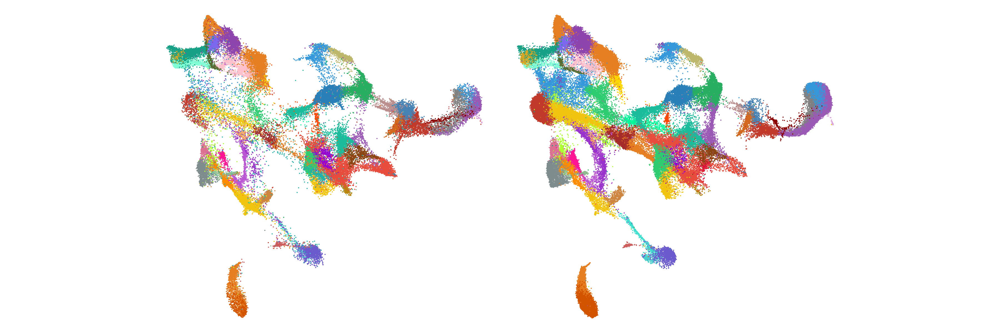

In [41]:
# Generate intermediate less saturated colors
distinct_colors <- c(
  "0" = "#C0392B", "1" = "#E67E22", "2" = "#F1C40F", "3" = "#27AE60", "4" = "#2980B9",
  "5" = "#8E44AD", "6" = "#D35400", "7" = "#F39C12", "8" = "#16A085", "9" = "#3498DB",
  "10" = "#9B59B6", "11" = "#7F8C8D", "12" = "#E74C3C", "13" = "#E67E22", "14" = "#F1C40F",
  "15" = "#1ABC9C", "16" = "#2ECC71", "17" = "#3498DB", "18" = "#9B59B6", "19" = "#C0392B",
  "20" = "#E74C3C", "21" = "#E67E22", "22" = "#F1C40F", "23" = "#1ABC9C", "24" = "#2ECC71",
  "25" = "#3498DB", "26" = "#9B59B6", "27" = "#A52A2A", "28" = "#E74C3C", "29" = "#E67E22",
  "30" = "#D2B48C", "31" = "#808080", "32" = "#FFC0CB", "33" = "#BDB76B", "34" = "#FFD700",
  "35" = "#00FA9A", "36" = "#4682B4", "37" = "#6A5ACD", "38" = "#9932CC", "39" = "#8B4513",
  "40" = "#DC143C", "41" = "#FF8C00", "42" = "#DAA520", "43" = "#ADFF2F", "44" = "#20B2AA",
  "45" = "#40E0D0", "46" = "#7B68EE", "47" = "#BA55D3", "48" = "#CD853F", "49" = "#BC8F8F",
  "50" = "#DB7093", "51" = "#D2691E", "52" = "#FF1493", "53" = "#7FFFD4", "54" = "#B8860B",
  "55" = "#556B2F", "56" = "#8FBC8F", "57" = "#48D1CC", "58" = "#9400D3", "59" = "#8B0000",
  "60" = "#FFDAB9", "61" = "#CD5C5C", "62" = "#FF4500", "63" = "#F4A460", "64" = "#DDA0DD"
)

# plot 1 is the UMAP with the stage in the scRNA or the E stage in the seqFISH
df_to_plot <- subset(FINAL_REFINED_ANNOTATIONS, joint_clusters_pass_QC == TRUE)

p3 <- # Plot
  ggplot(df_to_plot, aes(UMAP_1, UMAP_2, col=cluster)) + 
    #geom_point(data=stage, col='#E0E0E0', size = pt_sz_1) + 
    geom_point(size = pt_sz_1) +
    facet_wrap(~ dataset, ncol = 2) +  # Ensuring vertical stacking
    scale_color_manual(values=distinct_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)

p3

## Define a function for spatial plots

In [49]:
# Define the function to generate the plot
generate_plot <- function(embryo_number, cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1 = 36, font_sz = 30, pt_sz_1 = 0.25, pt_sz_2 = 1) {
  # Subset the data for the specified embryo
  df_to_plot_1 <- subset(df_total, embryo_name_updated_sf %in% embryo_number)
  df_to_plot_2 <- subset(df_total, joint_clusters_pass_QC == TRUE 
                         #& stage_alignment_pass_QC == TRUE 
                         & refined_annotation %in% cell_types_to_include & embryo_name_updated_sf %in% embryo_number)
  
  # Subset the data for the plot
  df_to_plot <- subset(FINAL_REFINED_ANNOTATIONS, joint_clusters_pass_QC == TRUE)
  
  # Create the plot
  p1 <- ggplot(df_to_plot_2, aes(dim1, dim2, col=refined_annotation)) + 
    geom_point(data=df_to_plot_1, col='#E0E0E0', size = pt_sz_1) + 
    geom_point(size = pt_sz_2) +
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)
  
  return(p1)
}

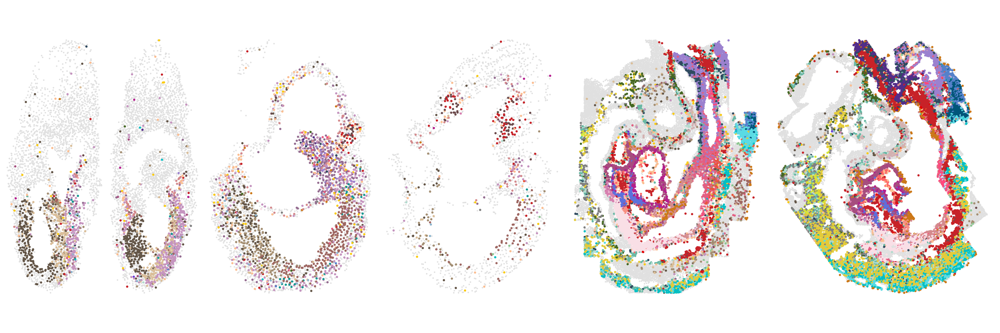

In [50]:
# MESODERM PLOT

font_sz_1 <- 36
font_sz <- 30
pt_sz_1 <- 0.5
pt_sz_2 <- 1.2

cell_types_to_include <- c(mesoderm_layer,                       
  "Epiblast",
  "Primitive Streak",
  "Nascent mesoderm",
  "PGC",
  "ExE mesoderm",
  "Haematoendothelial progenitors",
  "Blood progenitors",
  "ExE mesoderm and Anterior LPM",
  "Rostral ectoderm",
  "Caudal epiblast",
  "Endo")
                           
# Generate plots for different embryos
e1_meso <- generate_plot("1", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e2_meso <- generate_plot("2", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e3_meso <- generate_plot("3", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e4_meso <- generate_plot("4", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e5_meso <- generate_plot("5", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e6_meso <- generate_plot("6", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e7_meso <- generate_plot("7", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)

# Print the plots to check
meso <- e1_meso | e2_meso | e3_meso | e4_meso | e5_meso | e7_meso
meso

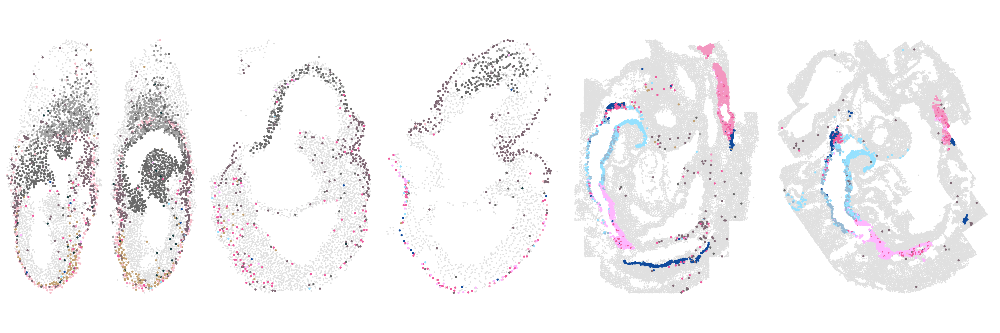

In [51]:
# Endoderm PLOT

cell_types_to_include <- c(endoderm_layer, "ExE ectoderm proximal", "ExE ectoderm distal")

# Generate plots for different embryos
e1_endo <- generate_plot("1", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e2_endo <- generate_plot("2", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e3_endo <- generate_plot("3", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e4_endo <- generate_plot("4", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e5_endo <- generate_plot("5", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e6_endo <- generate_plot("6", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e7_endo <- generate_plot("7", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)

# Print the plots to check
endo <- e1_endo | e2_endo | e3_endo | e4_endo | e5_endo | e7_endo
endo

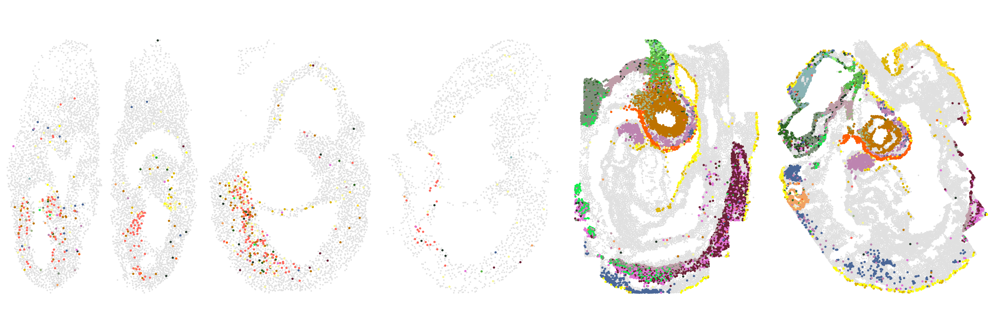

In [52]:
# Ectoderm PLOT

cell_types_to_include <- c(ectoderm_layer)

# Generate plots for different embryos
e1_ect <- generate_plot("1", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e2_ect  <- generate_plot("2", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e3_ect  <- generate_plot("3", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e4_ect  <- generate_plot("4", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e5_ect  <- generate_plot("5", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e6_ect  <- generate_plot("6", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)
e7_ect  <- generate_plot("7", cell_types_to_include, df_total, FINAL_REFINED_ANNOTATIONS, refined_annotation_colors, font_sz_1, font_sz, pt_sz_1, pt_sz_2)

# Print the plots to check
ecto <- e1_ect  | e2_ect  | e3_ect  | e4_ect  | e5_ect  | e7_ect 
ecto

### Proportional Cluster Plot

,E6.5_scRNA,E6.5_seqFISH,E6.75_scRNA,E7.0_scRNA,E7.25_scRNA,E7.5_scRNA,E7.5_seqFISH,E7.75_scRNA,E8.0_scRNA,E8.25_scRNA,E8.5_scRNA,E8.5_seqFISH,E8.75_scRNA,E9.0_scRNA,E9.25_scRNA,E9.5_scRNA
Epiblast,0.5720628415,0.09559550,0.35202312,0.314622810,0.241120219,0.08642774,0.050888530,0.014380531,0.0023920079,0.0005572583,1.324240e-04,2.682890e-03,0.0001344447,0.0000000000,0.0000000000,0.0000000000
Rostral ectoderm,0.0942622951,0.02113372,0.07803468,0.045524967,0.050774135,0.01733730,0.064351104,0.002765487,0.0011256508,0.0001393146,6.621201e-05,3.854293e-03,0.0000000000,0.0000000000,0.0000000000,0.0000000000
Primitive Streak,0.0758196721,0.06853644,0.15722543,0.206530807,0.186020036,0.04541338,0.017501346,0.004148230,0.0016884762,0.0002786291,0.000000e+00,2.229444e-03,0.0000000000,0.0000000000,0.0000000000,0.0000000000
Anterior Primitive Streak,0.0013661202,0.04009481,0.00867052,0.037421046,0.041211293,0.02587657,0.004577275,0.005254425,0.0019698888,0.0001393146,0.000000e+00,3.967654e-04,0.0000000000,0.0000000000,0.0000000000,0.0000000000
Nascent mesoderm,0.0006830601,0.09717559,0.07803468,0.132522941,0.182718579,0.08539268,0.093968767,0.010785398,0.0009849444,0.0006965729,1.986360e-04,3.759825e-03,0.0000000000,0.0001298364,0.0002429838,0.0002477701
ExE ectoderm distal,0.0177595628,0.15978669,0.01040462,0.006197116,0.008652095,0.03933238,0.018847604,0.059319690,0.0329252849,0.0160211758,1.324240e-03,7.557437e-05,0.0000000000,0.0002596728,0.0000000000,0.0000000000


[1] TRUE
  E6.5_scRNA E6.5_seqFISH  E6.75_scRNA   E7.0_scRNA  E7.25_scRNA   E7.5_scRNA 
           1            1            1            1            1            1 
E7.5_seqFISH  E7.75_scRNA   E8.0_scRNA  E8.25_scRNA   E8.5_scRNA E8.5_seqFISH 
           1            1            1            1            1            1 
 E8.75_scRNA   E9.0_scRNA  E9.25_scRNA   E9.5_scRNA 
           1            1            1            1 


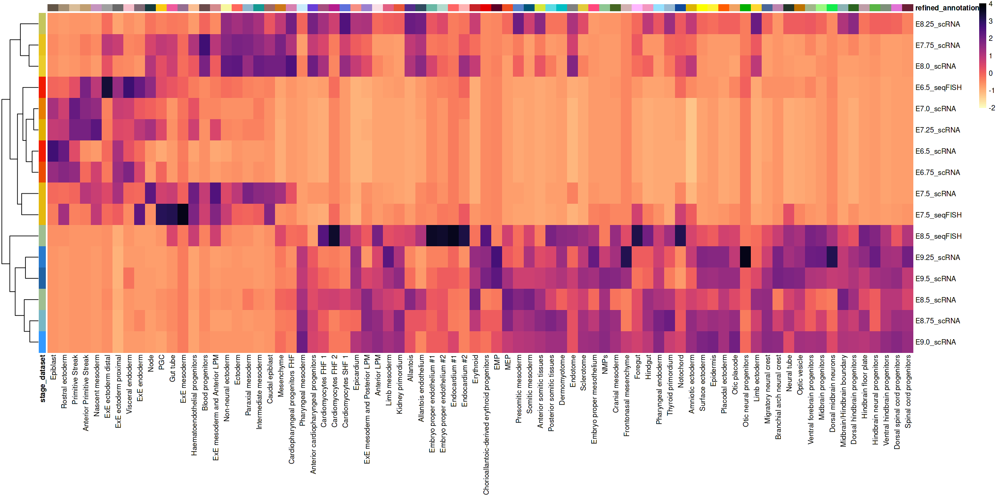

In [54]:
FINAL_REFINED_ANNOTATIONS$stage_dataset <- paste0(FINAL_REFINED_ANNOTATIONS$stage,"_", FINAL_REFINED_ANNOTATIONS$dataset)
FINAL_REFINED_ANNOTATIONS_SS <- subset(FINAL_REFINED_ANNOTATIONS, joint_clusters_pass_QC == TRUE)

FINAL_REFINED_ANNOTATIONS_SS$refined_annotation_ordered <- factor(FINAL_REFINED_ANNOTATIONS_SS$refined_annotation, 
                                                                  levels = ordered_refined_celltypes_figure_2)

options(repr.plot.width=5, repr.plot.height=6)
options(repr.plot.width=30, repr.plot.height=5)
width <- 10
height <- 5
pt_size <- 0.01


# list the colours for the annotations in the heatmap
my_colour = list(
    refined_annotation = refined_annotation_colors,
    stage_dataset = stage_dataset_colors)

# Create the table of cell counts
cell_counts <- table(FINAL_REFINED_ANNOTATIONS_SS$refined_annotation_ordered, FINAL_REFINED_ANNOTATIONS_SS$stage_dataset)

# Compute proportions within each embryo
proportions <- apply(cell_counts, 2, function(x) x/sum(x))

# Print the proportions
head(proportions)
                     
# Sum proportions for each embryo
sums <- colSums(proportions)

# Check if sums add up to 1
all_equal <- all(round(sums, 6) == 1)
                    
# Print if sums add up to 1
print(all_equal)
print(sums)                     
                     
options(repr.plot.width=20, repr.plot.height=10)
# Create the heatmap with inverted plasma color scale and no cell borders
# Define breaks for the heatmap scale, ensuring that it includes the maximum value
breaks <- seq(-2, 4, length.out = 101)
                     
row_annotations <- as.data.frame(rownames(proportions))
colnames(row_annotations) <- "refined_annotation"
row.names(row_annotations) <- row_annotations$refined_annotation
                     
col_annotations <- as.data.frame(colnames(proportions))
colnames(col_annotations) <- "stage_dataset"
row.names(col_annotations) <- col_annotations$stage_dataset


celltype_proportion_plot <- pheatmap(t(proportions), 
               color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = FALSE,
               scale = "column",
               breaks = breaks,
               annotation_col = row_annotations,
               annotation_row = col_annotations,
               annotation_colors = my_colour,
               legend = TRUE,
               annotation_legend = FALSE)
                     
# Save the grid plot as .svg file to specific file path
#ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_2_v2/stage_ID_vs_celltype_extended_atlas_heatmap.svg", plot = p1, device = "svg",
#      width = width,
#      height = height)

#### Generating Combined Panels

In [55]:
#umaps
p1 <- umap_p1
p2 <- umap_p2

#mesoderm
p3 <- e1_meso
p4 <- e2_meso
p5 <- e3_meso
p6 <- e4_meso
p7 <- e5_meso
p8 <- e7_meso

#ectoderm
p9 <- e1_ect
p10 <- e2_ect
p11 <- e3_ect
p12 <- e4_ect
p13 <- e5_ect
p14 <- e7_ect

#endoderm
p15 <- e1_endo 
p16 <- e2_endo
p17 <- e3_endo
p18 <- e4_endo
p19 <- e5_endo
p20 <- e7_endo

#proportional cell type plot
p21 <- celltype_proportion_plot

png 
  2

Plot saved to projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/main_panel_umap_1_combined_plot.pdf

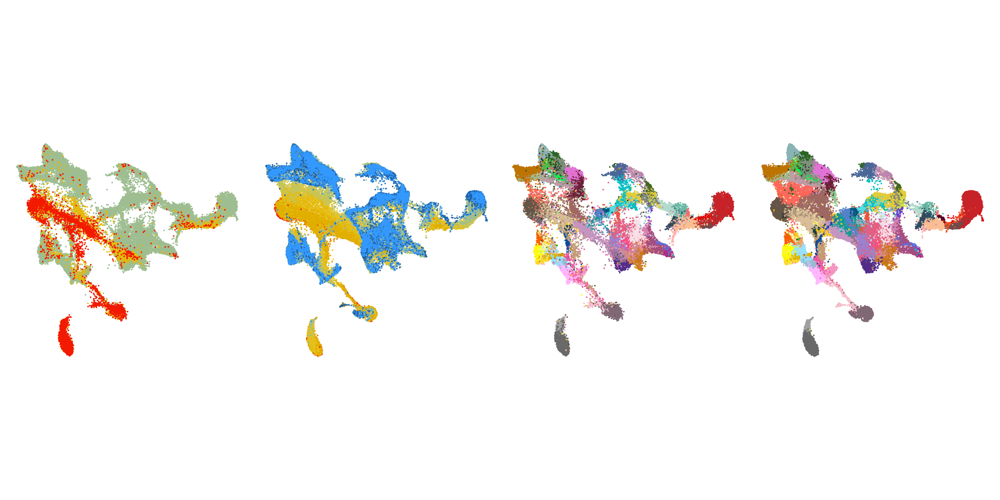

In [56]:
# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p3_raster <- rasterize_plot(p3)
p4_raster <- rasterize_plot(p4)
p5_raster <- rasterize_plot(p5)
p6_raster <- rasterize_plot(p6)
p7_raster <- rasterize_plot(p7)
p8_raster <- rasterize_plot(p8)
p9_raster <- rasterize_plot(p9)
p10_raster <- rasterize_plot(p10)
p11_raster <- rasterize_plot(p11)
p12_raster <- rasterize_plot(p12)
p13_raster <- rasterize_plot(p13)
p14_raster <- rasterize_plot(p14)
p15_raster <- rasterize_plot(p15)
p16_raster <- rasterize_plot(p16)
p17_raster <- rasterize_plot(p17)
p18_raster <- rasterize_plot(p18)
p19_raster <- rasterize_plot(p19)
p20_raster <- rasterize_plot(p20)


# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p3 <- ggplot() + annotation_custom(p3_raster) + theme_void()
p4 <- ggplot() + annotation_custom(p4_raster) + theme_void()
p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p6 <- ggplot() + annotation_custom(p6_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()
p8 <- ggplot() + annotation_custom(p8_raster) + theme_void()
p9 <- ggplot() + annotation_custom(p9_raster) + theme_void()
p10 <- ggplot() + annotation_custom(p10_raster) + theme_void()
p11 <- ggplot() + annotation_custom(p11_raster) + theme_void()
p12 <- ggplot() + annotation_custom(p12_raster) + theme_void()
p13 <- ggplot() + annotation_custom(p13_raster) + theme_void()
p14 <- ggplot() + annotation_custom(p14_raster) + theme_void()
p15 <- ggplot() + annotation_custom(p15_raster) + theme_void()
p16 <- ggplot() + annotation_custom(p16_raster) + theme_void()
p17 <- ggplot() + annotation_custom(p17_raster) + theme_void()
p18 <- ggplot() + annotation_custom(p18_raster) + theme_void()
p19 <- ggplot() + annotation_custom(p19_raster) + theme_void()
p20 <- ggplot() + annotation_custom(p20_raster) + theme_void()


# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- wrap_plots(
p1, p2,
  ncol = 2, nrow = 1) +
  plot_layout(
    widths = c(1, 1),
    heights = c(1)
  )

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/main_panel_umap_1_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = (150/4), height = (200/4)*1/5)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
cat("Plot saved to", file_path)

png 
  2

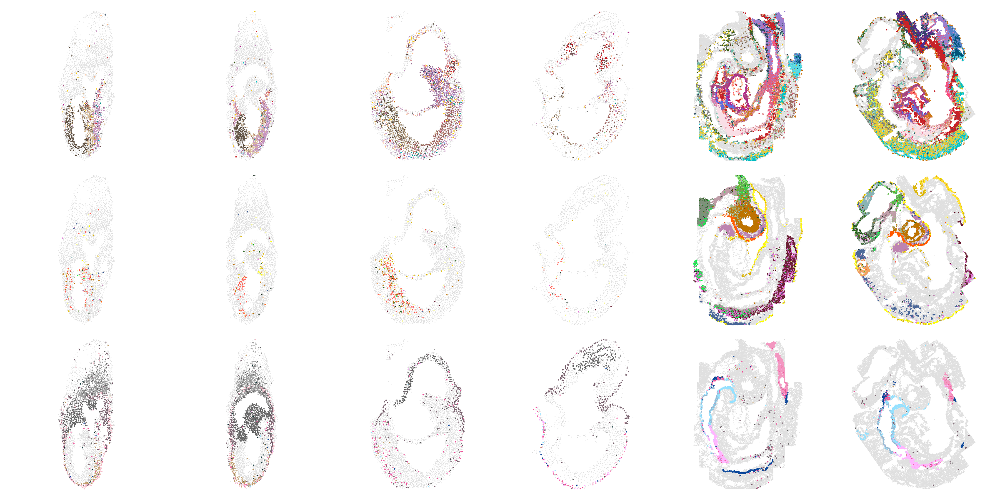

In [57]:
# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p3_raster <- rasterize_plot(p3)
p4_raster <- rasterize_plot(p4)
p5_raster <- rasterize_plot(p5)
p6_raster <- rasterize_plot(p6)
p7_raster <- rasterize_plot(p7)
p8_raster <- rasterize_plot(p8)
p9_raster <- rasterize_plot(p9)
p10_raster <- rasterize_plot(p10)
p11_raster <- rasterize_plot(p11)
p12_raster <- rasterize_plot(p12)
p13_raster <- rasterize_plot(p13)
p14_raster <- rasterize_plot(p14)
p15_raster <- rasterize_plot(p15)
p16_raster <- rasterize_plot(p16)
p17_raster <- rasterize_plot(p17)
p18_raster <- rasterize_plot(p18)
p19_raster <- rasterize_plot(p19)
p20_raster <- rasterize_plot(p20)


# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p3 <- ggplot() + annotation_custom(p3_raster) + theme_void()
p4 <- ggplot() + annotation_custom(p4_raster) + theme_void()
p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p6 <- ggplot() + annotation_custom(p6_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()
p8 <- ggplot() + annotation_custom(p8_raster) + theme_void()
p9 <- ggplot() + annotation_custom(p9_raster) + theme_void()
p10 <- ggplot() + annotation_custom(p10_raster) + theme_void()
p11 <- ggplot() + annotation_custom(p11_raster) + theme_void()
p12 <- ggplot() + annotation_custom(p12_raster) + theme_void()
p13 <- ggplot() + annotation_custom(p13_raster) + theme_void()
p14 <- ggplot() + annotation_custom(p14_raster) + theme_void()
p15 <- ggplot() + annotation_custom(p15_raster) + theme_void()
p16 <- ggplot() + annotation_custom(p16_raster) + theme_void()
p17 <- ggplot() + annotation_custom(p17_raster) + theme_void()
p18 <- ggplot() + annotation_custom(p18_raster) + theme_void()
p19 <- ggplot() + annotation_custom(p19_raster) + theme_void()
p20 <- ggplot() + annotation_custom(p20_raster) + theme_void()


# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- wrap_plots(
p3, p4, p5, p6, p7, p8, 
p9, p10, p11, p12, p13, p14,
p15, p16, p17, p18, p19, p20,
  ncol = 6, nrow = 3) +
  plot_layout(
    widths = c(1),
    heights = c(1, 1, 1, 1)
  )

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/main_panel_spatial_1_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = (150/4), height = (200/4)*3/5)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
#cat("Plot saved to", file_path)

png 
  2

Plot saved to projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/main_panel_heatmap_1_combined_plot.pdf

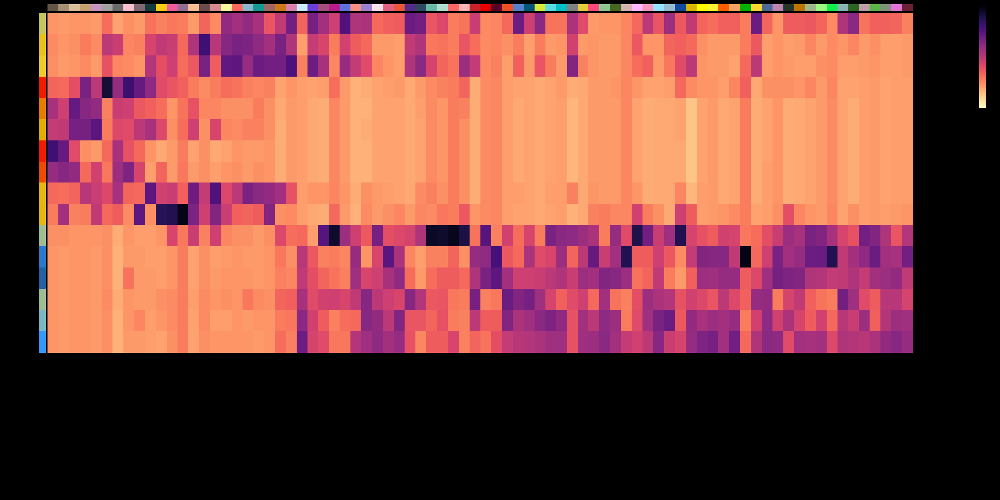

In [58]:
# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p3_raster <- rasterize_plot(p3)
p4_raster <- rasterize_plot(p4)
p5_raster <- rasterize_plot(p5)
p6_raster <- rasterize_plot(p6)
p7_raster <- rasterize_plot(p7)
p8_raster <- rasterize_plot(p8)
p9_raster <- rasterize_plot(p9)
p10_raster <- rasterize_plot(p10)
p11_raster <- rasterize_plot(p11)
p12_raster <- rasterize_plot(p12)
p13_raster <- rasterize_plot(p13)
p14_raster <- rasterize_plot(p14)
p15_raster <- rasterize_plot(p15)
p16_raster <- rasterize_plot(p16)
p17_raster <- rasterize_plot(p17)
p18_raster <- rasterize_plot(p18)
p19_raster <- rasterize_plot(p19)
p20_raster <- rasterize_plot(p20)


# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p3 <- ggplot() + annotation_custom(p3_raster) + theme_void()
p4 <- ggplot() + annotation_custom(p4_raster) + theme_void()
p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p6 <- ggplot() + annotation_custom(p6_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()
p8 <- ggplot() + annotation_custom(p8_raster) + theme_void()
p9 <- ggplot() + annotation_custom(p9_raster) + theme_void()
p10 <- ggplot() + annotation_custom(p10_raster) + theme_void()
p11 <- ggplot() + annotation_custom(p11_raster) + theme_void()
p12 <- ggplot() + annotation_custom(p12_raster) + theme_void()
p13 <- ggplot() + annotation_custom(p13_raster) + theme_void()
p14 <- ggplot() + annotation_custom(p14_raster) + theme_void()
p15 <- ggplot() + annotation_custom(p15_raster) + theme_void()
p16 <- ggplot() + annotation_custom(p16_raster) + theme_void()
p17 <- ggplot() + annotation_custom(p17_raster) + theme_void()
p18 <- ggplot() + annotation_custom(p18_raster) + theme_void()
p19 <- ggplot() + annotation_custom(p19_raster) + theme_void()
p20 <- ggplot() + annotation_custom(p20_raster) + theme_void()


# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- p21

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/main_panel_heatmap_1_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = 15, height = 10)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
cat("Plot saved to", file_path)

## Page 1, E8.5 Mesoderm

#### UMAP and SPATIAL PLOTS

In [59]:
cells_1 <- LPM
cells_2 <- cranial_somitic
cells_3 <- hematovascular

In [60]:
font_sz_1 <- 36
font_sz <- 30
pt_sz_1 <- 1
pt_sz_2 <- 0.5

Estage_to_include <- "E8.5"

In [61]:
colnames(FINAL_REFINED_ANNOTATIONS)

[1] "cell_ID"                                             
 [2] "orig.ident"                                          
 [3] "nCount_RNA"                                          
 [4] "nFeature_RNA"                                        
 [5] "seqFISH_celltype"                                    
 [6] "extended_atlas_celltype"                             
 [7] "AP"                                                  
 [8] "DV"                                                  
 [9] "dataset"                                             
[10] "cluster"                                             
[11] "subcluster"                                          
[12] "cluster_subcluster"                                  
[13] "stage"                                               
[14] "anatomy"                                             
[15] "UMAP_1"                                              
[16] "UMAP_2"                                              
[17] "celltype_PijuanSala2019"                             
[18] "majority_seqFISH_celltype"                           
[19] "majority_seqFISH_celltype_proportion"                
[20] "majority_extended_atlas_celltype"                    
[21] "majority_extended_atlas_celltype_proportion"         
[22] "majority_celltype_PijuanSala2019_celltype"           
[23] "majority_celltype_PijuanSala2019_celltype_proportion"
[24] "stage_transfer"                                      
[25] "poor_stage_alignment"                                
[26] "proportion_seqFISH_cells_per_subcluster"             
[27] "joint_clusters_pass_QC"                              
[28] "stage_alignment_pass_QC"                             
[29] "passed_QC"                                           
[30] "refined_annotation"                                  
[31] "stage_dataset"

In [62]:
colnames(FINAL_REFINED_ANNOTATIONS)

[1] "cell_ID"                                             
 [2] "orig.ident"                                          
 [3] "nCount_RNA"                                          
 [4] "nFeature_RNA"                                        
 [5] "seqFISH_celltype"                                    
 [6] "extended_atlas_celltype"                             
 [7] "AP"                                                  
 [8] "DV"                                                  
 [9] "dataset"                                             
[10] "cluster"                                             
[11] "subcluster"                                          
[12] "cluster_subcluster"                                  
[13] "stage"                                               
[14] "anatomy"                                             
[15] "UMAP_1"                                              
[16] "UMAP_2"                                              
[17] "celltype_PijuanSala2019"                             
[18] "majority_seqFISH_celltype"                           
[19] "majority_seqFISH_celltype_proportion"                
[20] "majority_extended_atlas_celltype"                    
[21] "majority_extended_atlas_celltype_proportion"         
[22] "majority_celltype_PijuanSala2019_celltype"           
[23] "majority_celltype_PijuanSala2019_celltype_proportion"
[24] "stage_transfer"                                      
[25] "poor_stage_alignment"                                
[26] "proportion_seqFISH_cells_per_subcluster"             
[27] "joint_clusters_pass_QC"                              
[28] "stage_alignment_pass_QC"                             
[29] "passed_QC"                                           
[30] "refined_annotation"                                  
[31] "stage_dataset"

##### generating the plots

In [63]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_1
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_1_umap <- left_side_plot                            
cells_1_spatial <- right_plot

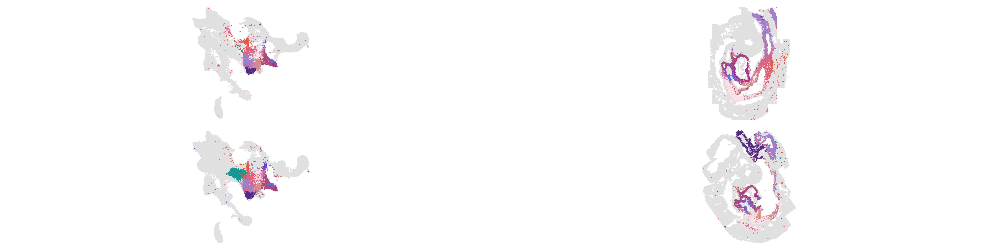

In [64]:
cells_1_umap | cells_1_spatial

In [65]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_2
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_2_umap <- left_side_plot                            
cells_2_spatial <- right_plot

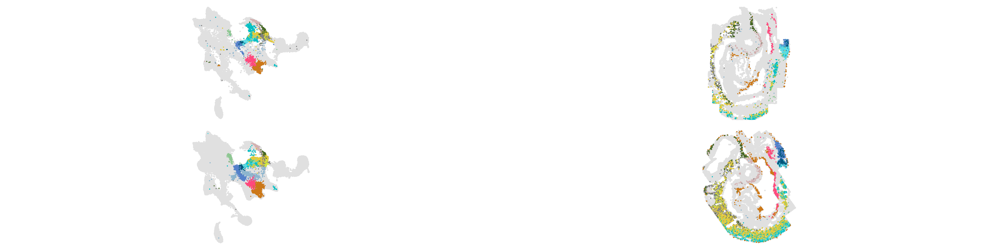

In [66]:
cells_2_umap | cells_2_spatial

In [67]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_3
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_3_umap <- left_side_plot                            
cells_3_spatial <- right_plot

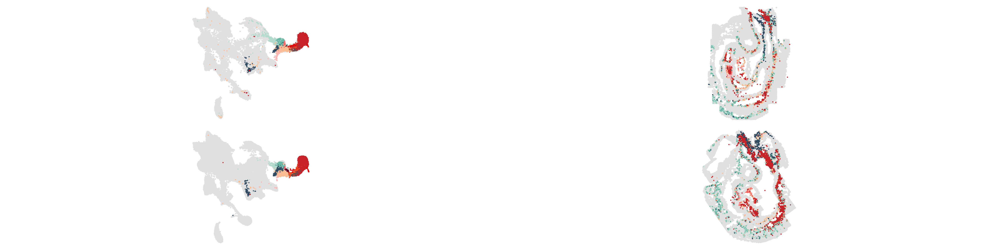

In [68]:
cells_3_umap | cells_3_spatial

#### Dot Plots of Marker Genes

##### FIND THE MARKERS

In [69]:
### FIND TOP MARKER GENES USING THE IMPUTED SPATIAL DATA ###

## Variables 
min_cells <- 0

## Cardiac mesoderm markers ###
cell_type_to_include <- cells_1

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_1_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)


## Paraxial mesoderm markers ###
cell_type_to_include <- cells_2

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_2_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

## LPM markers ###
cell_type_to_include <- cells_3

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_3_markers <- FindAllMarkers(    object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

Calculating cluster Intermediate mesoderm

Calculating cluster ExE mesoderm and Anterior LPM

Calculating cluster Anterior LPM

Calculating cluster ExE mesoderm and Posterior LPM

Calculating cluster Limb mesoderm

Calculating cluster Kidney primordium

Calculating cluster Allantois

Calculating cluster Epicardium

Calculating cluster Pharyngeal mesoderm

Calculating cluster Anterior cardiopharyngeal progenitors

Calculating cluster Cardiopharyngeal progenitors FHF

Calculating cluster Cardiomyocytes FHF 1

Calculating cluster Cardiomyocytes FHF 2

Calculating cluster Cardiomyocytes SHF 1

Calculating cluster Frontonasal mesenchyme

Calculating cluster NMPs

Calculating cluster Cranial mesoderm

Calculating cluster Embryo proper mesothelium

Calculating cluster Mesenchyme

Calculating cluster Presomitic mesoderm

Calculating cluster Somitic mesoderm

Calculating cluster Posterior somitic tissues

Calculating cluster Paraxial mesoderm

Calculating cluster Anterior somitic tissues

Calcu

##### GENERATE THE DOT PLOTS in Seurat First

In [70]:
# Variables
#font_sz <- 12
should_scale <- TRUE
aspect_ratio <- 1
line_thickness <- 0.5

In [71]:
### Cardiac Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- cells_1

cells_1_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_1_combined <- p1_p2_data_combined

Warning message:
“Could not find Pmp22 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Arg1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Nr2f2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hoxaas3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hoxb5os in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Crabp2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pax3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Tcf15 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Foxc1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Lgals1 in the default search

In [72]:
### Paraxial Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- cells_2

cells_2_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_2_combined <- p1_p2_data_combined

Warning message:
“Could not find Alx3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dlx2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Cystm1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Myl9 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Apoe in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Krt8 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pmp22 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Tcf15 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pax3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mesp1 in the default search location

In [73]:
### LPM Dot Plots ###

#VARIABLES
celltypes_present <- cells_3

cells_3_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_3_combined <- p1_p2_data_combined

Warning message:
“Could not find Id3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Cited4 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hbb-bt in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hba-x in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hbb-y in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hbb-bs in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Itga2b in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Vim in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ebf1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Sox11 in the default search loca

##### generate the dot plots in ggplot

In [74]:
font_sz <- 12
legend_position <- "right"

In [75]:
## Cardiac_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_1_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_1_dot_plot <- ggplot(cells_1_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## Paraxial_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_2_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_2_dot_plot <- ggplot(cells_2_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## LPM_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_3_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_3_dot_plot <- ggplot(cells_3_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


#### Generating Combined Panels

In [76]:
p1 <- cells_1_umap 
p2 <- cells_1_spatial
p3 <- cells_1_dot_plot 

p4 <- cells_2_umap 
p5 <- cells_2_spatial 
p6 <- cells_2_dot_plot 

p7 <- cells_3_umap 
p8 <- cells_3_spatial 
p9 <- cells_3_dot_plot 

#p10 <- hemato_endo_umap 
#p11 <- hemato_endo_spatial
#p12 <- hemato_endo_dot_plot 

In [77]:
combined_plot <- wrap_plots(p1, p2, p3, p4, p5, p6, p7, p8, p9, 
                            #p10, p11, p12,
                            ncol = 3, nrow = 3)

png 
  2

Plot saved to projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_1_combined_plot.pdf

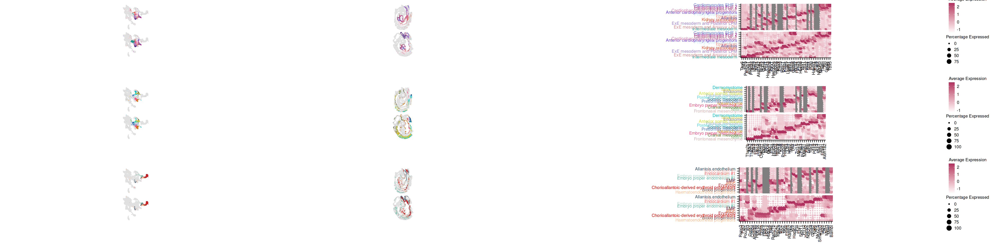

In [78]:
# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p4_raster <- rasterize_plot(p4)
p5_raster <- rasterize_plot(p5)
p7_raster <- rasterize_plot(p7)
p8_raster <- rasterize_plot(p8)

# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p4 <- ggplot() + annotation_custom(p4_raster) + theme_void()
p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()
p8 <- ggplot() + annotation_custom(p8_raster) + theme_void()

# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- wrap_plots(
  p1, p2, p3, spacer,
  spacer, spacer, spacer, spacer,
  p4, p5, p6, spacer,
  spacer, spacer, spacer, spacer,
  p7, p8, p9, spacer,
  spacer, spacer, spacer, spacer,
  #p10, p11, p12, spacer,
  ncol = 4, nrow = 6) +
  plot_layout(
    widths = c(1, 1, 1.2, 0.01),
    heights = c(1, 0, 1, 0, 1, 0, 1)
  )

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_1_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = 150/4, height = 200/4)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
cat("Plot saved to", file_path)

In [79]:
# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_1_cells_1_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_1_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_1_cells_2_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_2_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_1_cells_3_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_3_markers, file = file_path, row.names = FALSE)

## Page 2, E8.5 Ectoderm and Endoderm

In [80]:
Estage_to_include <- "E8.5"

cells_1 <- endoderm[endoderm != "Anterior Primitive Streak"]
cells_2 <- surface_ectoderm
cells_3 <- neural_tube

#### UMAP and SPATIAL PLOTS

##### the function

In [81]:

font_sz_1 <- 36
font_sz <- 30
pt_sz_1 <- 1
pt_sz_2 <- 0.5

##### generating the plots

In [82]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_1
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_1_umap <- left_side_plot                            
cells_1_spatial <- right_plot

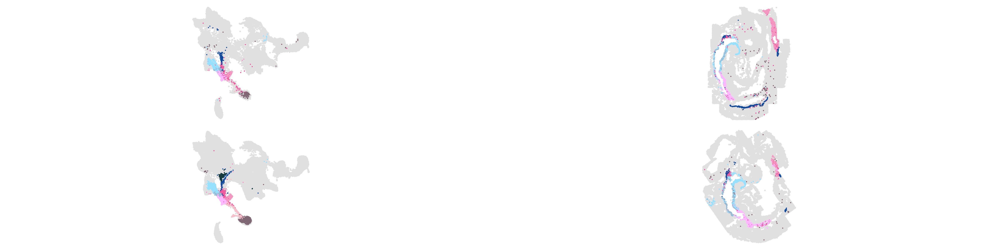

In [83]:
cells_1_umap | cells_1_spatial

In [84]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_2
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_2_umap <- left_side_plot                            
cells_2_spatial <- right_plot

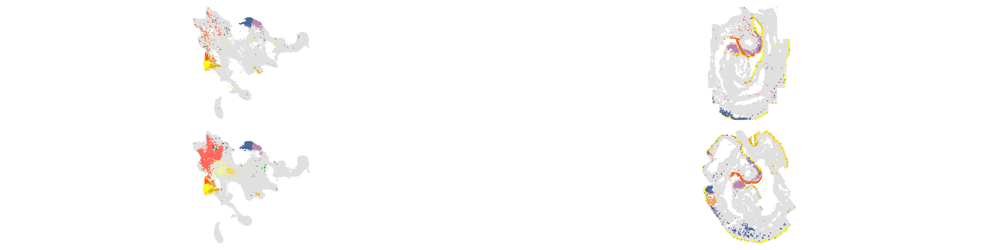

In [85]:
cells_2_umap | cells_2_spatial

In [86]:
# Example usage
embryo_vector_top <- c("1", "3")
embryo_vector_bottom <- c("2", "4")
embryo_vector_right <- c("5", "7")
cell_type_list <- cells_3
                                  
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)

# Combine right plots into single plot
right_plot <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the left side plot
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
cells_3_umap <- left_side_plot                            
cells_3_spatial <- right_plot

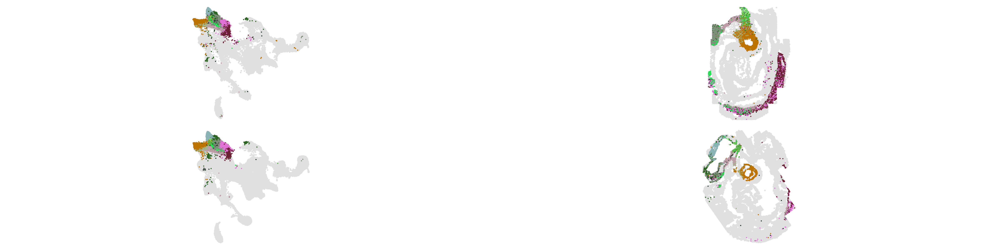

In [87]:
cells_3_umap | cells_3_spatial

#### Dot Plots of Marker Genes

##### FIND THE MARKERS

In [88]:
table(seurat_combined_seqFISH_post_QC@meta.data$stage_alignment_pass_QC)


FALSE  TRUE 
 7535 54170 

In [89]:
table(seurat_combined_seqFISH_post_QC@meta.data$Estage, seurat_combined_seqFISH_post_QC@meta.data$stage_alignment_pass_QC)

      
       FALSE  TRUE
  E6.5   744  4319
  E7.5   283  3431
  E8.5  6508 46420

In [90]:
### FIND TOP MARKER GENES USING THE IMPUTED SPATIAL DATA ###

## Variables 
Estage_to_include <- c("E8.5")
min_cells <- 0

## Cardiac mesoderm markers ###
cell_type_to_include <- cells_1

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_1_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)


## Paraxial mesoderm markers ###
cell_type_to_include <- cells_2

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_2_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

## LPM markers ###
cell_type_to_include <- cells_3

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_3_markers <- FindAllMarkers(    object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

Calculating cluster Notochord

Calculating cluster Gut tube

Calculating cluster Hindgut

Calculating cluster Foregut

Calculating cluster Pharyngeal endoderm

Calculating cluster Thyroid primordium

Calculating cluster ExE endoderm

Calculating cluster Visceral endoderm

Calculating cluster Otic placode

Calculating cluster Ectoderm

Calculating cluster Migratory neural crest

Calculating cluster Branchial arch neural crest

Calculating cluster Non-neural ectoderm

Calculating cluster Surface ectoderm

Calculating cluster Epidermis

Calculating cluster Limb ectoderm

Calculating cluster Amniotic ectoderm

Calculating cluster Placodal ectoderm

Calculating cluster Otic neural progenitors

Calculating cluster Optic vesicle

Calculating cluster Hindbrain floor plate

Calculating cluster Hindbrain neural progenitors

Calculating cluster Ventral forebrain progenitors

Calculating cluster Midbrain/Hindbrain boundary

Calculating cluster Midbrain progenitors

Calculating cluster Dorsal midbr

##### GENERATE THE DOT PLOTS in Seurat First

In [91]:
# Variables
#font_sz <- 12
should_scale <- TRUE
aspect_ratio <- 1
line_thickness <- 0.5

In [92]:
### Cardiac Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- cells_1

cells_1_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_1_combined <- p1_p2_data_combined

Warning message:
“Could not find Gsc in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Hoxaas3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Arg1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mest in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Foxe1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pax9 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Sparc in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Spink1 in the default search locations, found in imputed assay instead”


In [93]:
### Paraxial Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- cells_2

cells_2_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_2_combined <- p1_p2_data_combined

Warning message:
“Could not find Lmx1a in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Tbx2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Foxd3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pax3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Twist1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Emb in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Apoe in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Krt7 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Wnt6 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mt2 in the default search locations, 

In [94]:
### LPM Dot Plots ###

#VARIABLES
celltypes_present <- cells_3

cells_3_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_3_combined <- p1_p2_data_combined

Warning message:
“Could not find Wnt8b in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Nkx2-9 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ptch1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Nkx2-1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Lhx5 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Foxd1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find En2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Fgf8 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Gadd45g in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ascl1 in the default search loc

##### generate the dot plots in ggplot

In [95]:
font_sz <- 12
legend_position <- "right"

In [96]:
## Cardiac_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_1_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_1_dot_plot <- ggplot(cells_1_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## Paraxial_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_2_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_2_dot_plot <- ggplot(cells_2_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## LPM_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_3_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_3_dot_plot <- ggplot(cells_3_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


#### Generating Combined Panels

In [97]:
p1 <- cells_1_umap 
p2 <- cells_1_spatial
p3 <- cells_1_dot_plot 

p4 <- cells_2_umap 
p5 <- cells_2_spatial 
p6 <- cells_2_dot_plot 

p7 <- cells_3_umap 
p8 <- cells_3_spatial 
p9 <- cells_3_dot_plot 

#p10 <- hemato_endo_umap 
#p11 <- hemato_endo_spatial
#p12 <- hemato_endo_dot_plot 

In [98]:
combined_plot <- wrap_plots(p1, p2, p3, p4, p5, p6, p7, p8, p9, 
                            #p10, p11, p12,
                            ncol = 3, nrow = 3)

png 
  2

Plot saved to projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_2_combined_plot.pdf

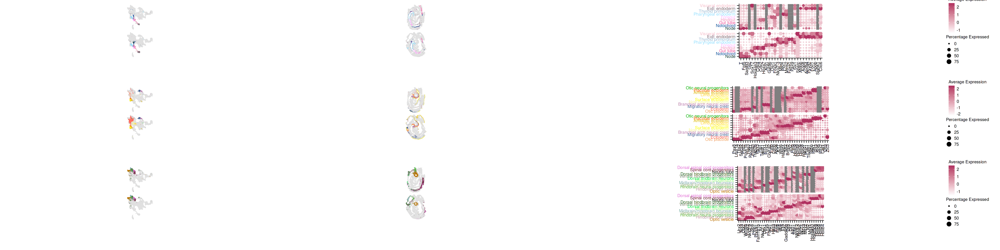

In [99]:
library(ggplot2)
library(patchwork)
library(Cairo)
library(grid)
library(png)

# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p4_raster <- rasterize_plot(p4)
p5_raster <- rasterize_plot(p5)
p7_raster <- rasterize_plot(p7)
p8_raster <- rasterize_plot(p8)

# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p4 <- ggplot() + annotation_custom(p4_raster) + theme_void()
p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()
p8 <- ggplot() + annotation_custom(p8_raster) + theme_void()

# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- wrap_plots(
  p1, p2, p3, spacer,
  spacer, spacer, spacer, spacer,
  p4, p5, p6, spacer,
  spacer, spacer, spacer, spacer,
  p7, p8, p9, spacer,
  spacer, spacer, spacer, spacer,
  #p10, p11, p12, spacer,
  ncol = 4, nrow = 6) +
  plot_layout(
    widths = c(1, 1, 1.2, 0.01),
    heights = c(1, 0, 1, 0, 1, 0, 1)
  )

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_2_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = 150/4, height = 200/4)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
cat("Plot saved to", file_path)

In [100]:
# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_2_cells_1_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_1_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_2_cells_2_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_2_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_2_cells_3_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_3_markers, file = file_path, row.names = FALSE)

## Page 3, E6.5 and E7.5 all cell types

#### UMAP and SPATIAL PLOTS

##### the function

In [101]:
font_sz_1 <- 36
font_sz <- 30
pt_sz_1 <- 1
pt_sz_2 <- 0.5

In [102]:
Estage_to_include <- c("E6.5", "E7.5")

In [103]:
create_left_side_plot <- function(final_refined_annotations, celltype_vector, point_size_1, point_size_2, refined_annotation_colors, Estage_to_include) {
  # Subset for seqFISH dataset
  cell_type_plot_seqFISH <- subset(final_refined_annotations, 
                                   refined_annotation %in% celltype_vector & 
                                   stage %in% Estage_to_include & 
                                   dataset %in% "seqFISH")
  
  # Subset for scRNA dataset (including all stages)
  cell_type_plot_scRNA <- subset(final_refined_annotations, 
                                 refined_annotation %in% celltype_vector & 
                                 dataset %in% "scRNA")
  
  # Combine both subsets
  cell_type_plot <- rbind(cell_type_plot_seqFISH, cell_type_plot_scRNA)
  
  # Plot
  ggplot(cell_type_plot, aes(UMAP_1, UMAP_2, col=refined_annotation)) + 
    geom_point(data=final_refined_annotations, col='#E0E0E0', size = point_size_1) + 
    geom_point(size = point_size_2) +
    facet_wrap(~ dataset, ncol = 1) +  # Ensuring vertical stacking
    scale_color_manual(values=refined_annotation_colors) + 
    theme_void() + 
    theme(
      legend.position = 'none',
      strip.text.x = element_blank(),  # Remove facet labels on x-axis
      strip.text.y = element_blank(),  # Remove facet labels on y-axis
      axis.title.y = element_blank()
    ) +  
    coord_fixed(ratio = 1)
}

##### generating the plots

In [104]:
cell_type_list <- early_gastrula


# Example usage
embryo_vector_right <- c("1", "2")

# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_1 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Example usage
embryo_vector_right <- c("3", "4")
cell_type_list <- early_gastrula
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_2 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the umap side plot
embryo_vector_right <- c("1", "2", "3", "4")
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
umap_1 <- left_side_plot                            
spatial_1L <- right_plot_1
spatial_1R <- right_plot_2

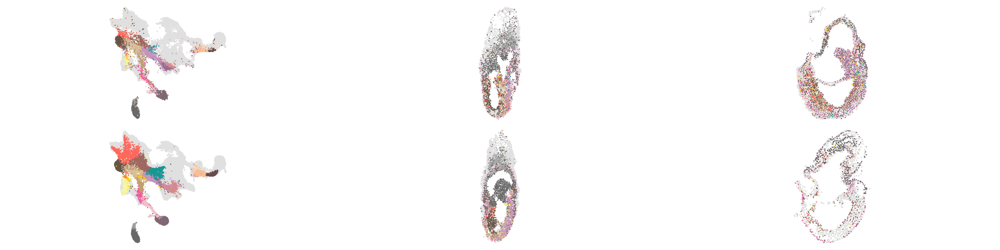

In [105]:
umap_1 | spatial_1L | spatial_1R

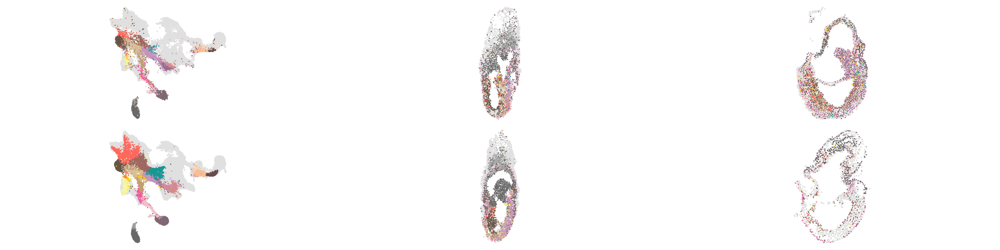

In [106]:
cell_type_list <- early_gastrula


# Example usage
embryo_vector_right <- c("1", "2")

# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_1 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Example usage
embryo_vector_right <- c("3", "4")
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_2 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the umap side plot
embryo_vector_right <- c("1", "2", "3", "4")
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
umap_2 <- left_side_plot                            
spatial_2L <- right_plot_1
spatial_2R <- right_plot_2

umap_2 | spatial_2L | spatial_2R

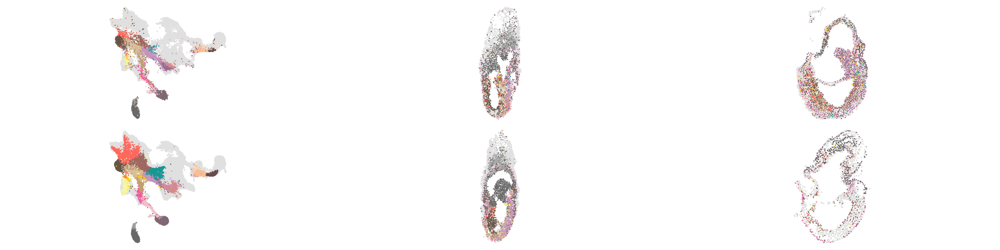

In [107]:
cell_type_list <- early_gastrula

# Example usage
embryo_vector_right <- c("1", "2")

# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_1 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Example usage
embryo_vector_right <- c("3", "4")
# Generate individual embryo plots
plot_list_right <- create_individual_embryo_plots(df_total, embryo_vector_right, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors)
# Combine right plots into single plot
right_plot_2 <- plot_grid(plotlist = plot_list_right, ncol = 1)

# Create the umap side plot
embryo_vector_right <- c("1", "2", "3", "4")
left_side_plot <- create_left_side_plot(FINAL_REFINED_ANNOTATIONS, cell_type_list, pt_sz_1, pt_sz_2, refined_annotation_colors, Estage_to_include)

#### SAVE THE PLOTS ####
umap_3 <- left_side_plot                            
spatial_3L <- right_plot_1
spatial_3R <- right_plot_2

umap_3 | spatial_3L | spatial_3R

#### Dot Plots of Marker Genes

##### FIND THE MARKERS

In [108]:
### FIND TOP MARKER GENES USING THE IMPUTED SPATIAL DATA ###

## Variables 
min_cells <- 0

## Cardiac mesoderm markers ###
cell_type_to_include <- early_gastrula

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_1_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)


## Paraxial mesoderm markers ###
cell_type_to_include <- early_gastrula

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_2_markers <- FindAllMarkers(
                                  object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

## LPM markers ###
cell_type_to_include <- early_gastrula

object <- subset(seurat_combined_seqFISH_post_QC, Estage %in% Estage_to_include & refined_annotation %in% cell_type_to_include)
Idents(object) <- "refined_annotation_ord"
DefaultAssay(object) <- "imputed"
cells_3_markers <- FindAllMarkers(    object,
                                  assay = "imputed",
                                  features = combined_marker_genes,
                                  slot = "data",
                                  min.cells.group = min_cells)

Calculating cluster ExE ectoderm proximal

Calculating cluster ExE ectoderm distal

Calculating cluster Ectoderm

Calculating cluster Non-neural ectoderm

Calculating cluster PGC

Calculating cluster Epiblast

Calculating cluster Rostral ectoderm

Calculating cluster Caudal epiblast

Calculating cluster Primitive Streak

Calculating cluster Nascent mesoderm

Calculating cluster Intermediate mesoderm

Calculating cluster ExE mesoderm

Calculating cluster ExE mesoderm and Anterior LPM

Calculating cluster Haematoendothelial progenitors

Calculating cluster Blood progenitors

Calculating cluster Anterior Primitive Streak

Calculating cluster Gut tube

Calculating cluster ExE endoderm

Calculating cluster Visceral endoderm

Calculating cluster ExE ectoderm proximal

Calculating cluster ExE ectoderm distal

Calculating cluster Ectoderm

Calculating cluster Non-neural ectoderm

Calculating cluster PGC

Calculating cluster Epiblast

Calculating cluster Rostral ectoderm

Calculating cluster Ca

##### GENERATE THE DOT PLOTS in Seurat First

In [109]:
# Variables
#font_sz <- 12
should_scale <- TRUE
aspect_ratio <- 1
line_thickness <- 0.5

In [110]:
### Cardiac Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- early_gastrula

cells_1_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 2) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_1_combined <- p1_p2_data_combined

Warning message:
“Could not find Ascl2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dlx5 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dppa3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ifitm3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mesp1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pmp22 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ttr in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Spink1 in the default search locations, found in imputed assay instead”


In [111]:
### Paraxial Mesoderm Dot Plots ###

#VARIABLES
celltypes_present <- early_gastrula

cells_2_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 2) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))
cells_2_combined <- p1_p2_data_combined

Warning message:
“Could not find Ascl2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dlx5 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dppa3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ifitm3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mesp1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pmp22 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ttr in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Spink1 in the default search locations, found in imputed assay instead”


In [112]:
### LPM Dot Plots ###

#VARIABLES
celltypes_present <- early_gastrula

cells_3_markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 2) %>%
    ungroup() -> top_markers

seqFISH_object_to_use <- subset(seurat_combined_seqFISH_post_QC, refined_annotation %in% celltypes_present)
scRNA_object_to_use <- subset(seurat_combined_atlas_post_QC, refined_annotation %in% celltypes_present)

Idents(seqFISH_object_to_use) <- "refined_annotation_ord"
Idents(scRNA_object_to_use) <- "refined_annotation_ord"

#### seqFISH Plot ####

# Create p1 without legend
p1_data <- DotPlot(object = seqFISH_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

#### scRNA Plot ####
# Create p2 without legend
p2_data <- DotPlot(object = scRNA_object_to_use, 
                   features = unique(c(top_markers$gene)),
                   cols = c("white", "maroon"),
                   dot.min = 0,
                   assay = "originalexp",
                   scale = should_scale)$data

# Determine the number of rows containing the first id
first_id <- p1_data$id[1]
x <- sum(p1_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p1_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p1_data$gene <- rep(gene_names, length.out = nrow(p1_data))

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p1_data <- p1_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

# Determine the number of rows containing the first id
first_id <- p2_data$id[1]
x <- sum(p2_data$id == first_id)

# Extract the gene names for the first x rows and remove 'imputed_' prefix
gene_names <- rownames(p2_data)[1:x]
gene_names <- gsub('^imputed_', '', gene_names)

# Create a new 'gene' column and repeat the gene names
p2_data$gene <- rep(gene_names, length.out = nrow(p2_data))
p2_data$gene <- factor(p2_data$gene, levels = gene_names)


# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    pct.exp.corrected = ifelse(is.na(features.plot), 25, pct.exp),
    shape = ifelse(is.na(features.plot), 15, 16)  # 15 for square, 16 for circle
  )

# Create a new column with corrected dot sizes based on avg.exp.scaled
p2_data <- p2_data %>%
  mutate(
    avg.exp.scaled.corrected = ifelse(is.na(features.plot), NA, avg.exp.scaled)
  )

### MAKE A COMBINED DATAFRAME FOR THE DOT PLOT ###

p1_data$dataset <- "seqFISH"
p2_data$dataset <- "scRNA"

p1_p2_data_combined <- rbind(p1_data,p2_data)
p1_p2_data_combined$gene <- factor(p1_p2_data_combined$gene, levels = gene_names)

p1_p2_data_combined$dataset <- factor(p1_p2_data_combined$dataset, levels = c("seqFISH", "scRNA"))

Warning message:
“Could not find Ascl2 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dlx5 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Dppa3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ifitm3 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Mesp1 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Pmp22 in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Ttr in the default search locations, found in imputed assay instead”
Warning message:
“Could not find Spink1 in the default search locations, found in imputed assay instead”


##### generate the dot plots in ggplot

In [113]:
font_sz <- 12
legend_position <- "right"

In [114]:
## Cardiac_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_1_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_1_dot_plot <- ggplot(cells_1_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## Paraxial_mesoderm_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_2_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_2_dot_plot <- ggplot(cells_2_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

## LPM_dot_plot ###
# Create a named vector for the colors of y-axis labels
unique_ids <- as.character(unique(cells_3_combined$id))
y_axis_colors <- refined_annotation_colors[unique_ids]

# Create the plot using the modified data
cells_3_dot_plot <- ggplot(cells_3_combined, aes(x = gene, y = id)) +
  geom_point(aes(size = pct.exp.corrected, color = avg.exp.scaled.corrected, shape = factor(shape))) +
  scale_color_gradient(low = "white", high = "maroon", name = "Average Expression") +  # Use gradient color scale from white to maroon and set legend name
  scale_size_continuous(name = "Percentage Expressed") +  # Set name for size legend
  scale_shape_manual(values = c(15, 16)) +  # 15 for square, 16 for circle
  facet_wrap(~dataset, ncol = 1) +
  theme_void() +  # Apply void theme
  theme(
    axis.text.x = element_text(family = "Arial", size = font_sz, angle = 90, hjust = 1, vjust = 0.5, margin = margin(t = 5)),  # Rotate x-axis text 90 degrees and set font size
    axis.text.y = element_text(family = "Arial", size = font_sz, hjust = 1, color = y_axis_colors, margin = margin(r = 5)),  # Color y-axis labels based on cell type
    axis.title.y = element_blank(),
    axis.line = element_line(size = line_thickness, color = "black"),  # Add x and y axes with thickness of 0.5
    axis.ticks = element_line(size = line_thickness, color = "black"),  # Add axis ticks with thickness of 0.5
    axis.ticks.length = unit(2, "mm"),
    legend.position = legend_position,  # Move legend to the bottom
    legend.text = element_text(size = font_sz),  # Set legend text font size
    legend.title = element_text(size = font_sz),  # Set legend title font size
    legend.box = "vertical",  # Stack legends vertically
    legend.box.just = "center",  # Center the legends
    legend.margin = margin(t = 0, b = 0, unit = "pt"),  # Reduce the margin above and below the legend
    legend.spacing = unit(0, "pt"),  # Reduce the spacing between legends
    legend.spacing.y = unit(5, "pt"),  # Adjust the spacing between the stacked legends
    strip.text = element_blank()
  ) +
  guides(
    color = guide_colorbar(order = 1),  # Ensure "Average Expression" legend is a continuous color bar and on top
    size = guide_legend(order = 2),  # Ensure "Percentage Expressed" legend is on bottom
    shape = "none"  # Remove shape legend
  ) +
  coord_fixed(ratio = aspect_ratio)

Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”
Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


#### Generating Combined Panels

In [115]:
p1 <- umap_1 
p2 <- spatial_1L
p3 <- spatial_1R 
p4 <- cells_1_dot_plot 

p5 <- umap_2 
p6 <- spatial_2L 
p7 <- spatial_2R 
p8 <- cells_2_dot_plot
 
p9 <- umap_3 
p10 <- spatial_3L 
p11 <- spatial_3R
p12 <- cells_3_dot_plot 

In [116]:
combined_plot <- wrap_plots(p1, p2, p3, p4, p5, p6, p7, p8, p9, 
                            p10, p11, p12,
                            ncol = 4, nrow = 6)

png 
  2

Plot saved to projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_3_combined_plot.pdf

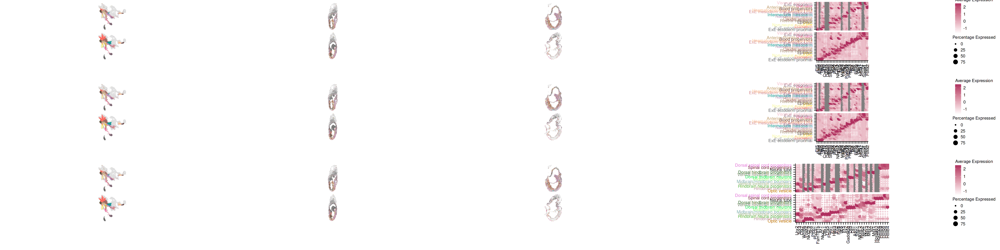

In [117]:
library(ggplot2)
library(patchwork)
library(Cairo)
library(grid)
library(png)

# Function to rasterize specific plots
rasterize_plot <- function(plot, dpi = 300) {
  temp_file <- tempfile(fileext = ".png")
  png(filename = temp_file, width = 7, height = 7, units = "in", res = dpi)
  print(plot)
  dev.off()
  img <- readPNG(temp_file)
  rasterGrob(img)
}

# Create plots
p1_raster <- rasterize_plot(p1)
p2_raster <- rasterize_plot(p2)
p3_raster <- rasterize_plot(p3)

p5_raster <- rasterize_plot(p5)
p6_raster <- rasterize_plot(p6)
p7_raster <- rasterize_plot(p7)

p9_raster <- rasterize_plot(p9)
p10_raster <- rasterize_plot(p10)
p11_raster <- rasterize_plot(p11)

# Wrapping rasterized plots in a ggplot
p1 <- ggplot() + annotation_custom(p1_raster) + theme_void()
p2 <- ggplot() + annotation_custom(p2_raster) + theme_void()
p3 <- ggplot() + annotation_custom(p3_raster) + theme_void()

p5 <- ggplot() + annotation_custom(p5_raster) + theme_void()
p6 <- ggplot() + annotation_custom(p6_raster) + theme_void()
p7 <- ggplot() + annotation_custom(p7_raster) + theme_void()

p9 <- ggplot() + annotation_custom(p9_raster) + theme_void()
p10 <- ggplot() + annotation_custom(p10_raster) + theme_void()
p11 <- ggplot() + annotation_custom(p11_raster) + theme_void()

# Create spacers
spacer <- plot_spacer()

# Combine plots using wrap_plots and adjust layout
combined_plot <- wrap_plots(
  p1, p2, p3, p4,
  spacer, spacer, spacer, spacer,
  p5, p6, p7, p8,
  spacer, spacer, spacer, spacer,
  p9, p10, p11, p12,
  spacer, spacer, spacer, spacer,
  ncol = 4, nrow = 6) +
  plot_layout(
    widths = c(1, 1, 1, 1),
    heights = c(1, 0, 1, 0, 1, 0)
  )

# Specify the file path where you want to save the PDF file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_3_combined_plot.pdf"

# Save the combined plot as a PDF file with rasterized subplots
Cairo::CairoPDF(file = file_path, width = 150/4, height = 200/4)
print(combined_plot)
dev.off()

# Print a message to confirm the plot has been saved
cat("Plot saved to", file_path)

In [118]:
# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_3_cells_1_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_1_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_3_cells_2_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_2_markers, file = file_path, row.names = FALSE)

# Specify the file path where you want to save the CSV file
file_path <- "projects/03_seqFISH_FINAL/code/CELL_GENOMICS_REVISIONS/outputs/Figure_2_proper_filtering/panel_3_cells_3_markers.csv"

# Save the data frame as a CSV file
write.csv(cells_3_markers, file = file_path, row.names = FALSE)

## Print out Package Versions

In [34]:
sessionInfo()

R version 4.2.1 (2022-06-23)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 20.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/openblas-pthread/libblas.so.3
LAPACK: /usr/lib/x86_64-linux-gnu/openblas-pthread/liblapack.so.3

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] stringr_1.5.0               Matrix_1.5-1               
 [3] plotly_4.10.0               sp_1.5-0                   
 [5] SeuratObject_4.1.2          Seurat_4.2.0               
 [7] patchwork_1.1.2             harmony_0.1.0              
 [9] Rcpp_1.0.10                 scran_1.26.2               
[11] StabMap_0.1.8 